# Libraries and Initial Setup
### Note:
You'll likely need to edit some of the parameters names throughout the code if you want to use this code for your own DNA Origami Image Analysis Needs (ex: the files used had the keys "Abio_0," "Abio_3," "Abio+B_0," and "Abio+B_3," which is likely not what you have for your cell types.

Also, please edit the filepath for your own system

In [1]:
from typing import no_type_check_decorator
# Packages for Plotting Data and General-Use Functions

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# Additional Packagge for Assigning Bins to a Histogram:
from skimage import exposure

# KS-Two-Sample Test Package
from scipy.stats import ks_2samp

# Packages for reading images and converting from RGB to gray and vice-versa
from skimage import color, io

# Otsu Thresholding Package
from skimage.filters import threshold_otsu

# Hough Transform Packages
from skimage.transform import hough_circle, hough_circle_peaks, rotate, hough_ellipse
from skimage.feature import canny
from skimage.draw import circle_perimeter, ellipse_perimeter
from skimage.util import img_as_ubyte

# Miscellanous General-Use Packages
import os, re, copy, math 
from google.colab import files

# Interpolation:
from scipy import interpolate

# Importing Images Used In Analysis
from google.colab import drive
drive.mount('/content/drive')

# Polynomial Regression Function:
def polyfit(x, y, degree):
    results = {}

    coeffs = np.polyfit(x, y, degree)

     # Polynomial Coefficients
    results['polynomial'] = coeffs.tolist()

    # r-squared
    p = np.poly1d(coeffs)
    # fit values, and mean
    yhat = p(x)   
    results['plot-yhat'] = yhat                    # or [p(z) for z in x]
    ybar = np.sum(y)/len(y)          # or sum(y)/len(y)
    ssres = np.sum((yhat-y)**2)   # or sum([ (yihat - ybar)**2 for yihat in yhat])
    sstot = np.sum((y - ybar)**2)    # or sum([ (yi - ybar)**2 for yi in y])

    # https://en.wikipedia.org/wiki/Coefficient_of_determination
    results['r-squared'] = 1 - ssres / sstot

    return results

# Code to read all images into a dictionary of dictionaries
# Format: dictionary[Cell_Type][Cell_Number] = image
# Cell_Type: 'Abio+B_0', 'Abio_3', 'Abio_0', 'Abio+B_3'
# Cell_Number: Cell_1, Cell_2, Cell_3, etc.. Number of Cell_Number variates depends on Cell_Type
directory = YOUR_DIRECTORY (the directory containing your cell images)
imgDict = dict()

for folder in os.listdir(directory):
  pathnameTmp = directory+"/"+folder
  folderPath = os.listdir(pathnameTmp)
  imgDict[folder] = dict()
  
  for fileIndex in range(len(folderPath)):
    regExKey = re.search(string = str(folderPath[fileIndex]), pattern = "Cell_[0-9]").group(0)
    folderPath[fileIndex] = pathnameTmp+"/"+folderPath[fileIndex]
    cellImgTmp = io.imread(folderPath[fileIndex])
    imgDict[folder][regExKey] = cellImgTmp



Mounted at /content/drive


# Filing the DNA Origami Cells into a Dictionary

In [2]:
# Obtain only the red channel of the image
def retrieveRed(img, showResult = False):
  cell_img = img.copy()
  cell_img[:,:,1] = 0
  cell_img[:,:,2] = 0
  cell_img = cell_img[:,:,0]

  if (showResult):
    plt.imshow(cell_img)
  return cell_img

def retrieveMask(img, showResult = False):
  cell_img = img.copy()
  cell_img[:,:,0] = 0
  cell_img[:,:,1] = 0
  cell_img = cell_img[:,:,2]

  if (showResult):
    plt.imshow(cell_img)
  return cell_img


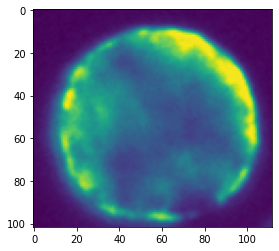

In [3]:
imgFilteredDict = dict()
for cell_key in imgDict.keys():
  cellKeyDict = dict()
  for cell_num in imgDict[cell_key].keys():
    cellNumDict = dict()
    tmpImg = imgDict[cell_key][cell_num]
    imgRedTmp = retrieveRed(tmpImg, showResult=False)
    imgMaskTmp = retrieveMask(tmpImg, showResult=False)
    cellNumDict["Image"] = imgRedTmp
    cellNumDict["Mask"] = imgMaskTmp
    cellKeyDict[cell_num] = cellNumDict
  imgFilteredDict[cell_key] = cellKeyDict

  

plt.imshow(imgFilteredDict["Abio_0"]["Cell_1"]["Image"])


# Hough Transform

Sigma: 2
Low Threshold: 31.0
High Threshold: 50


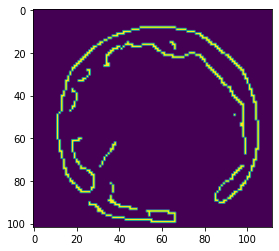

<Figure size 432x288 with 0 Axes>

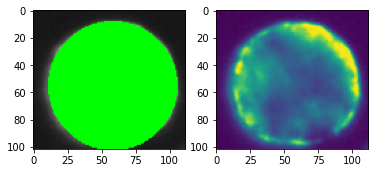

In [4]:

# caution: x-axis and y-axis of image is not well defined throughout the code.
def identifyCircleCoordinates(img, sigmaVal = 1, lowThreshold = None, highThreshold = None,
                              radiiLow = None, showResult = False):
  image = img.copy()
  imageRGB = color.gray2rgb(image)
  imageRGBShow = imageRGB.copy()
  radiiHigh = min(img.shape[0]//2,img.shape[1]//2)
  imgMean = np.mean(image)//1
  imgStd = np.std(image)//1

  hist, bins = exposure.histogram(image)
  bin_max = np.where(hist == hist.max())

  if (lowThreshold == None):
    lowThreshold = max(bins[bin_max][0], imgMean - imgStd)
  if (highThreshold == None):
    highThreshold = min(lowThreshold + imgStd, imgMean + imgStd)
  
  # Edge Cases for lowThreshold and highThreshold Selection
  if (lowThreshold >= highThreshold): 
    # lowThreshold was too high
    lowThreshold = min(bins[bin_max][0], imgMean - imgStd)
    if (lowThreshold >= highThreshold):
      # highThreshold was too low
      lowThreshold = max(bins[bin_max][0], imgMean - imgStd)
      highThreshold = max(lowThreshold + imgStd, imgMean + imgStd)
      if (lowThreshold >= highThreshold):
      # highThreshold was too low AND lowThreshold was too high
        lowThreshold = min(bins[bin_max][0], imgMean - imgStd)
        highThreshold = max(lowThreshold + imgStd, imgMean + imgStd)
        if (lowThreshold >= highThreshold):
          # should not be possible since one selection is "imgMean - imgStd"
          # for lowThreshold and the other is "imgMean + imgStd" for highThreshold
          # and imgStd > 0
          print(f"ERROR: Low Threshold {lowThreshold} is higher than High Threshold {highThreshold}")
          assert(False)
  if (radiiLow == None):
    radiiLow = (radiiHigh) - 10


  edges = canny(image, sigma=sigmaVal, low_threshold=lowThreshold, high_threshold=highThreshold)
  if (showResult):
    print(f"Sigma: {sigmaVal}")
    print(f"Low Threshold: {lowThreshold}")
    print(f"High Threshold: {highThreshold}")
    f0 = plt.figure()
    ax0 = f0.subplots(1,1)
    ax0.imshow(edges)
  


  # Detecting one radii
  hough_radii = np.arange(radiiLow, radiiHigh, 1)
  hough_res = hough_circle(edges, hough_radii)

  # Select the most prominent circle given the range
  accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii,
                                            total_num_peaks=1)
  # maybe perform some check to show that the "true" circle was detected?

  # highlight circle:
  center_x, center_y, radius = zip(cx, cy, radii).__next__()
  circy, circx = circle_perimeter(center_y, center_x, radius,
                                        shape=image.shape)
  
  # 
  # ls = [image[0,0], image[xMax, 0], image[0, yMax], image[xMax, yMax]]
  # fourCorners = np.array(ls)
  # threshold = np.max(fourCorners)
  # # probably a better way of doing this...
  # xThreshold = list()
  # yThreshold = list()
  # for x in range(0, xMax+1):
  #   for y in range(0, yMax+1):
  #     if (image[x,y][0] <= threshold):
  #       xThreshold.append(x)
  #       yThreshold.append(y)
  # image[xThreshold, yThreshold] = (0,0,255)


  # for a given y, make a dictionary of arrays for the corresponding x:

  circleDict = dict()
  for i in range(len(circy)):
    if (circy[i] not in circleDict):
      circleDict[circy[i]] = set()
    circleDict[circy[i]].add(circx[i])
  
  for key in circleDict.keys():
    identifyMin = min(circleDict[key])
    identifyMax = max(circleDict[key])
    if (identifyMin == identifyMax):
      refKey = np.random.choice(list(circleDict.keys()))
      differenceMinRefKey = abs(identifyMin - min(circleDict[refKey]))
      differenceMaxRefKey = abs(identifyMin - max(circleDict[refKey]))
      while (differenceMinRefKey == differenceMaxRefKey):
        refKey = np.random.choice(list(circleDict.keys()))
        differenceMinRefKey = abs(identifyMin - min(circleDict[refKey]))
        differenceMaxRefKey = abs(identifyMin - max(circleDict[refKey]))
      if (differenceMinRefKey > differenceMaxRefKey):
        identifyMin = 0 
      else:
        identifyMax = imageRGB.shape[1]-1
    
    for x in range(identifyMin, identifyMax+1):
       imageRGB[key, x] = (0, 255, 0)
       circleDict[key].add(x)
    prevKey = key
  if (showResult):
    plt.figure()
    f, axArr = plt.subplots(1,2) 
    axArr[0].imshow(imageRGB)
    axArr[1].imshow(img)

  return circleDict



testImg = imgFilteredDict["Abio_0"]["Cell_1"]["Image"]
testCircleCoordinates = identifyCircleCoordinates(testImg, sigmaVal = 2, highThreshold = 50, showResult = True)



# Helper Functions

In [5]:
def mergeDictionaries(dict1, dict2):
  mergeDictionary = dict1.copy()
  for key in dict2.keys():
    if (key not in dict1.keys()):
      mergeDictionary[key] = set()
    for elem in dict2[key]:
      if (elem not in mergeDictionary[key]):
        mergeDictionary[key].add(elem)
    if (mergeDictionary[key] == set()):
      mergeDictionary[key].pop()
  return mergeDictionary

def displayingResults(img, dictionary, display = True, returnResults = True):
  image = img.copy()
  xRange = image.shape[1] - 1
  yRange = image.shape[0] - 1
  for x in range(xRange+1):
    for y in range(yRange+1):
      if (y not in dictionary.keys() or x not in dictionary[y]):
        image[y,x] = 0

  if (display):
    fig = plt.figure()
    gs = GridSpec(nrows=1,ncols=2)
    ax0 = fig.add_subplot(gs[0,0])
    ax1 = fig.add_subplot(gs[0,1])
    ax0.imshow(image)
    ax1.imshow(img)
  if (returnResults):
    return image
  

# Convert the format to a matplotlib feasible format

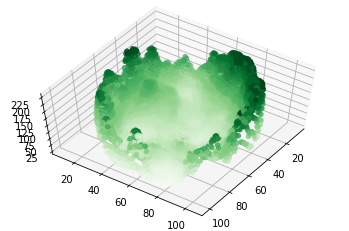

In [6]:
# Given a dictionary in the form "{y: (x1, x2,...)}" and image, returns a dictionary
# of the form "{intensity: ((y1, x1), (y2, x2),...)}"
def getCircleIntensities(img, dictionary):
  intensityDict = dict()
  for y in dictionary.keys():
    for x in dictionary[y]:
      intensity = img[y, x]
      if (intensity not in intensityDict):
        intensityDict[intensity] = set()
      intensityDict[intensity].add((y, x))
  return intensityDict

testCircleIntensities = getCircleIntensities(testImg, testCircleCoordinates)

# Given a dictionary in the form "{intensity: ((y1, x1), (y2, x2),...)}" returns
# a dictionary of the form "{x: number, y: number, z: number}"s
def simplifyIntensitiesAndPlot(dictionary, plot = True):
  xdata = list()
  ydata = list()
  zdata = list()
  for intensity in dictionary.keys():
    for coordinate in dictionary[intensity]:
      ydata.append(coordinate[0])
      xdata.append(coordinate[1])
      zdata.append(intensity)

  # Initialize to np arrays:
  xdata = np.array(xdata)
  ydata = np.array(ydata)
  zdata = np.array(zdata)

  # Create dictionary for coordinates w/intensities:
  plotDataDict = dict()
  plotDataDict["x"] = xdata
  plotDataDict["y"] = ydata
  plotDataDict["z"] = zdata


  if (plot):
    fig = plt.figure()
    ax = plt.axes(projection='3d')

    ax.scatter(ydata, xdata, zdata, c=zdata, cmap='Greens');
    ax.view_init(60, 35)
  
  return plotDataDict

testPlottingCoordinates = simplifyIntensitiesAndPlot(testCircleIntensities)

# Get Otsu Thresholded Image

In [15]:
def getOtsuThresholdDict(image, plot = False):
  threshold = threshold_otsu(image)
  thresholdDict = dict()
  thresholdDict["x"] = list()
  thresholdDict["y"] = list()
  thresholdDict["z"] = list()

  originalDict = dict()
  originalDict["x"] = list()
  originalDict["y"] = list()
  originalDict["z"] = list()


  nrows = len(image)
  ncols = len(image[0])
  for pixelRowIndex in range(nrows):
    for pixelColIndex in range(ncols):
      if (image[pixelRowIndex][pixelColIndex] > threshold):
        thresholdDict["x"].append(pixelColIndex)
        thresholdDict["y"].append(pixelRowIndex)
        thresholdDict["z"].append(image[pixelRowIndex][pixelColIndex])
      originalDict["x"].append(pixelColIndex)
      originalDict["y"].append(pixelRowIndex)
      originalDict["z"].append(image[pixelRowIndex][pixelColIndex])
      
  thresholdDict["x"] = np.array(thresholdDict["x"])
  thresholdDict["y"] = np.array(thresholdDict["y"])
  thresholdDict["z"] = np.array(thresholdDict["z"])
  originalDict["x"] = np.array(originalDict["x"])
  originalDict["y"] = np.array(originalDict["y"])
  originalDict["z"] = np.array(originalDict["z"])
  if (plot):
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    ax.view_init(60, 35)
    fig2 = plt.figure()
    ax2 = plt.axes(projection='3d')
    ax.scatter(originalDict["y"], originalDict["x"], originalDict["z"], c=originalDict["z"], cmap='Greens');
    ax2.scatter(thresholdDict["y"], thresholdDict["x"], thresholdDict["z"], c=thresholdDict["z"], cmap='Greens');
    ax.set_title("Original Image")
    ax2.set_title("Thresholded Image")
    ax2.view_init(60, 35)

  return thresholdDict


# 2D Intensity Plot

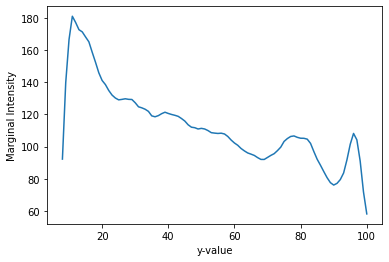

In [16]:
def makeIntensityGraph2D(dictionary, xView = True, plot = True):
  xData = dictionary["x"]
  yData = dictionary["y"]
  zData = dictionary['z']

  if (xView):
    xAxisData = xData
    xLabel = "x-value"
  else:
    xAxisData = yData
    xLabel = "y-value"
  zLabel = "Marginal Intensity"

  minXAxis = min(xAxisData)
  maxXAxis = max(xAxisData)
  difference = maxXAxis-minXAxis
  xAxisVals = np.arange(minXAxis, maxXAxis)
  yAxisVals = np.zeros(difference) # initialize y Axis

  retainingIndices = list()
  for i in range(difference):
    checkingVal = minXAxis + i
    xIndices = np.where(xAxisData == checkingVal)[0]
    if (len(xIndices) > 0):
      retainingIndices.append(i)
    intensityMean = np.mean(zData[xIndices])
    yAxisVals[i] = intensityMean
  yAxisVals = yAxisVals[np.array(retainingIndices)]
  xAxisVals = xAxisVals[np.array(retainingIndices)]
  if (plot):
    ax = plt.axes()
    ax.set_xlabel(xLabel)
    ax.set_ylabel(zLabel)
    ax.plot(xAxisVals, yAxisVals)
  return [xAxisVals, yAxisVals]
givenY = makeIntensityGraph2D(testPlottingCoordinates,False)

#distancesIn3DScatterPlot = distanceMetric(plotifiableIntensities)


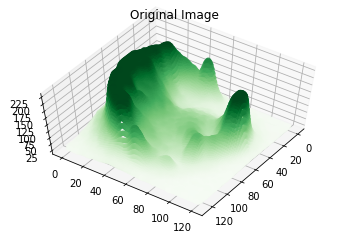

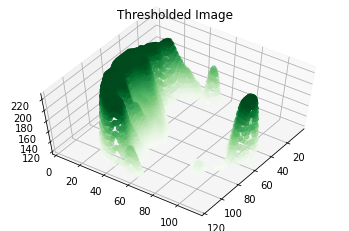

In [9]:
imageAnalysis = imgFilteredDict["Abio+B_0"]["Cell_2"]["Image"]
plotifiableIntensities = getOtsuThresholdDict(imageAnalysis, plot = True)

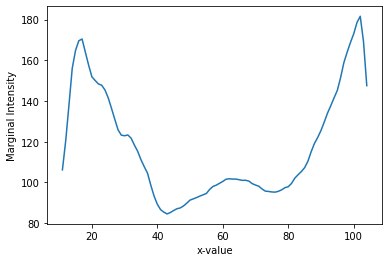

In [10]:
resultX = makeIntensityGraph2D(testPlottingCoordinates)

# Histogram Plotting

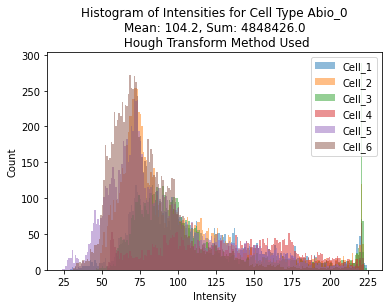

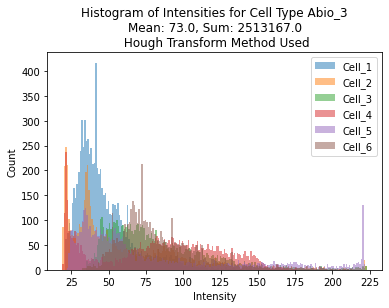

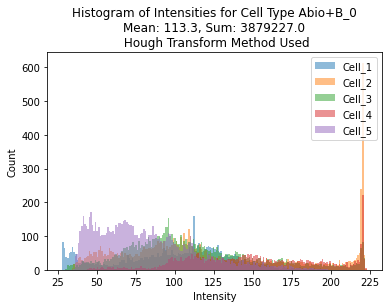

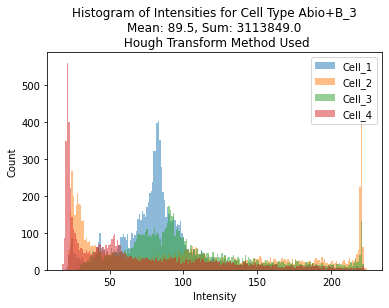

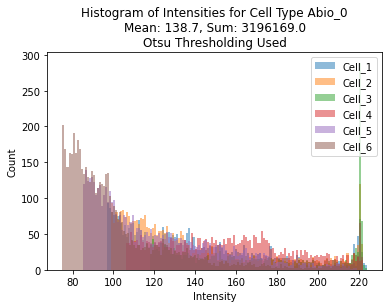

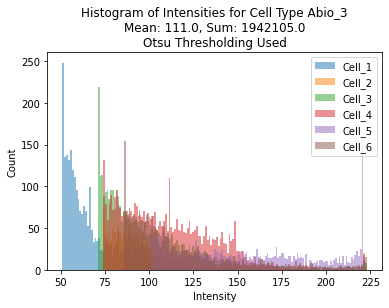

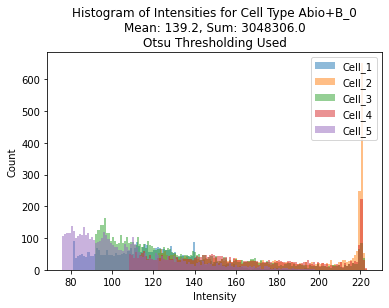

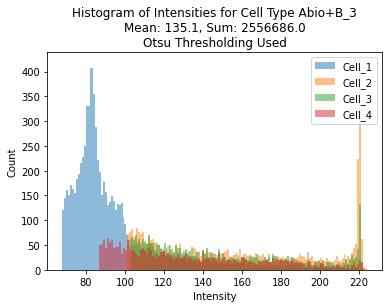

In [17]:
def returnHistogramVals(imgDict, cellType, cellNumber):
  imageAnalysis = imgDict[cellType][cellNumber]["Image"]
  circleCoords = identifyCircleCoordinates(imageAnalysis)
  circleIntensities = getCircleIntensities(imageAnalysis, circleCoords)
  plotifiableIntensities = simplifyIntensitiesAndPlot(circleIntensities, plot = False)
  histogramOfIntensities = plotifiableIntensities["z"]
  return histogramOfIntensities

def plotHistogramsReturnMean(imgDict, cellType, save = False, thresholdMethod = False):
  fig = plt.figure()
  gs = GridSpec(nrows=1,ncols=1)
  axFig = fig.add_subplot(gs[0,0])
  #axFig4.axvline(histogramValsMean, color='k', linestyle='dashed', linewidth=1)
  
  meanHistogramIntensity = 0
  intensitySum = 0
  for cellNumber in imgDict[cellType].keys():
    if (thresholdMethod):
      imageAnalysis = imgDict[cellType][cellNumber]["Image"]
      intensitiesTmp = getOtsuThresholdDict(imageAnalysis, plot = False)["z"]
    else:
      intensitiesTmp = returnHistogramVals(imgDict, cellType, cellNumber)
    meanHistogramIntensity += np.mean(intensitiesTmp)
    intensitySum += np.sum(intensitiesTmp)
    axFig.hist(intensitiesTmp, alpha=0.5, label=cellNumber, bins = len(set(intensitiesTmp)))
  nSamples = len(list(imgDict[cellType].keys()))
  meanHistogramIntensity = meanHistogramIntensity/nSamples
  axFig.legend(loc='upper right')
  if (thresholdMethod):
    titleString = f"Histogram of Intensities for Cell Type {cellType}\nMean: {round(meanHistogramIntensity, 1)}, Sum: {round(intensitySum, 1)}\nOtsu Thresholding Used"
  else:
    titleString = f"Histogram of Intensities for Cell Type {cellType}\nMean: {round(meanHistogramIntensity, 1)}, Sum: {round(intensitySum, 1)}\n Hough Transform Method Used"

  axFig.set_title(titleString)
  axFig.set_xlabel("Intensity")
  axFig.set_ylabel("Count")
  if (save):
    if (thresholdMethod):
      nameFig=f"{cellType}_Stacked_Histogram_Otsu_Thresholding.png"
    else:
      nameFig=f"{cellType}_Stacked_Histogram_Hough_Transform_Method.png"
    fig.savefig(nameFig)
    files.download(nameFig)
  return meanHistogramIntensity, intensitySum



meanAbio0, intensityAbio0 = plotHistogramsReturnMean(imgFilteredDict, "Abio_0",save=False)
meanAbio3, intensityAbio3 = plotHistogramsReturnMean(imgFilteredDict, "Abio_3",save=False)
meanAbioB0, intensityAbioB0 = plotHistogramsReturnMean(imgFilteredDict, "Abio+B_0",save=False)
meanAbioB3, intensityAbioB3 = plotHistogramsReturnMean(imgFilteredDict, "Abio+B_3",save=False)
meanAbio0Threshold,intensityAbio0Threshold = plotHistogramsReturnMean(imgFilteredDict, "Abio_0",save=False, thresholdMethod = True)
meanAbio3Threshold,intensityAbio3Threshold = plotHistogramsReturnMean(imgFilteredDict, "Abio_3",save=False, thresholdMethod = True)
meanAbioB0Threshold,intensityAbioB0Threshold = plotHistogramsReturnMean(imgFilteredDict, "Abio+B_0",save=False, thresholdMethod = True)
meanAbioB3Threshold,intensityAbioB3Threshold = plotHistogramsReturnMean(imgFilteredDict, "Abio+B_3",save=False, thresholdMethod = True)





# Bar Plotting

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

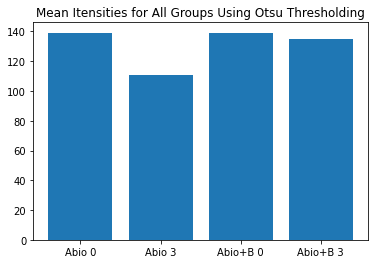

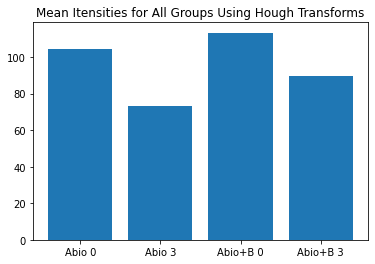

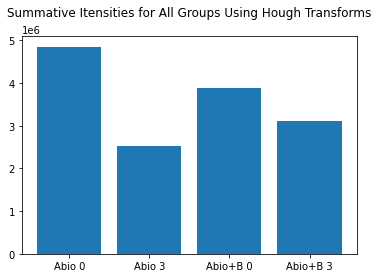

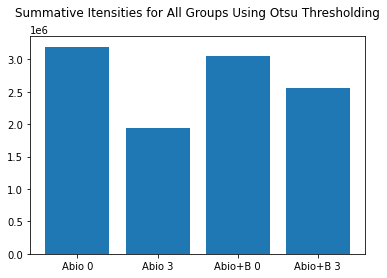

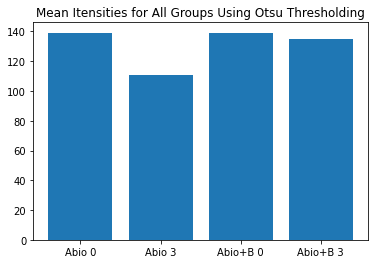

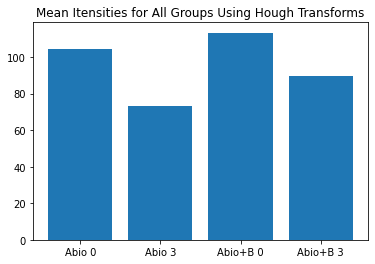

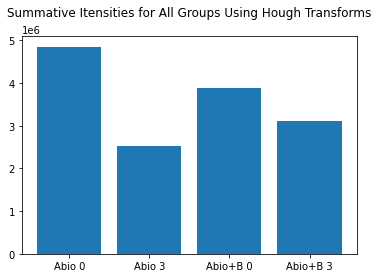

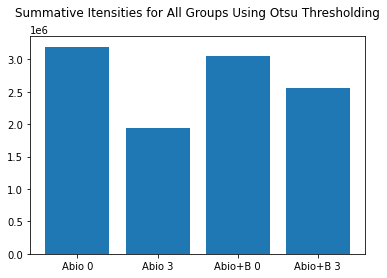

In [18]:
def plotBar(labels, x,thresholdMethod=False, calcMean = True, calcSum = False, save=False):

  if (calcMean):
    prefix = "Mean"
  elif (calcSum):
    prefix = "Summative"

  else:
    prefix = None
  title = prefix + " Itensities for All Groups"
  if (thresholdMethod):
    title = title + " Using Otsu Thresholding"
  else:
    title = title + " Using Hough Transforms"
  fig = plt.figure()
  gs = GridSpec(nrows=1,ncols=1)
  axFig = fig.add_subplot(gs[0,0])
  axFig.bar(labels, x)
  if calcSum:
    axFig.set_title(title,pad=20)
  else:
    axFig.set_title(title)
  if (save):
    if (thresholdMethod):
      nameFig="Bar_Plot_Otsu_Thresholding.png"
    else:
      nameFig="Bar_Plot_Hough_Transform_Method.png"
    fig.savefig(nameFig)
    files.download(nameFig)



labels = ["Abio 0", "Abio 3", "Abio+B 0", "Abio+B 3"]
meansThreshold = [meanAbio0Threshold, meanAbio3Threshold, meanAbioB0Threshold, meanAbioB3Threshold]
meansHough = [meanAbio0, meanAbio3, meanAbioB0, meanAbioB3]
intensitiesHough = [intensityAbio0, intensityAbio3, intensityAbioB0, intensityAbioB3]
intensitiesThreshold = [intensityAbio0Threshold, intensityAbio3Threshold, intensityAbioB0Threshold, intensityAbioB3Threshold]
thresholdingMeans = plotBar(labels, meansThreshold,thresholdMethod=True)
houghMeans = plotBar(labels, meansHough)
thresholdSums = plotBar(labels, intensitiesHough, calcMean=False, calcSum=True)
thresholdSums = plotBar(labels, intensitiesThreshold, calcMean=False, calcSum=True, thresholdMethod=True)
plotBar(labels, meansThreshold,thresholdMethod=True,save=True)
plotBar(labels, meansHough,save=True)
plotBar(labels, intensitiesHough, calcMean=False, calcSum=True,save=True)
plotBar(labels, intensitiesThreshold, calcMean=False, calcSum=True, thresholdMethod=True,save=True)

In [19]:


# meanAbio0 = plotHistogramsReturnMean(imgFilteredDict, "Abio_0",save=True)
# meanAbio3 = plotHistogramsReturnMean(imgFilteredDict, "Abio_3",save=True)
# meanAbioB0 = plotHistogramsReturnMean(imgFilteredDict, "Abio+B_0",save=True)
# meanAbioB3 = plotHistogramsReturnMean(imgFilteredDict, "Abio+B_3",save=True)
# meanAbio0Threshold = plotHistogramsReturnMean(imgFilteredDict, "Abio_0",save=True, thresholdMethod = True)
# meanAbio3Threshold = plotHistogramsReturnMean(imgFilteredDict, "Abio_3",save=True, thresholdMethod = True)
# meanAbioB0Threshold = plotHistogramsReturnMean(imgFilteredDict, "Abio+B_0",save=True, thresholdMethod = True)
# meanAbioB3Threshold = plotHistogramsReturnMean(imgFilteredDict, "Abio+B_3",save=True, thresholdMethod = True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.


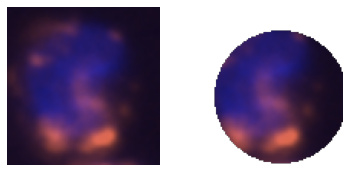

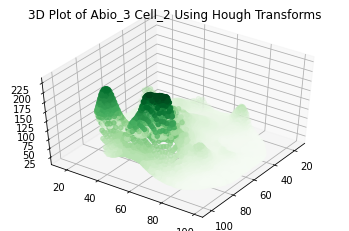

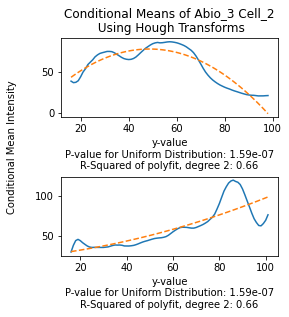

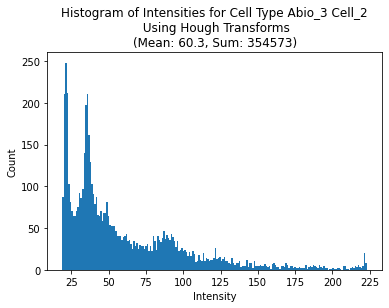

In [20]:
# Get Figure of Results:
np.random.seed(100)

def displayResultsFigure(imgDict, cellType, cellNumber, useMask = False, 
                         referenceDict = None, save = False, degreeFit = 2,thresholdMethod=False):
  # ensures that the dictionary "imgDict" is of the form:
  # dictionary[cellType][cellNumber] = {"Image", "Mask"}
  # dictionary[cellType][cellNumber]["Image"] = Filtered Image
  # dictionary[cellType][cellNumber]["Image"] = Mask for the Filtereds Image
  imageAnalysis = imgDict[cellType][cellNumber]["Image"]
  if (thresholdMethod):
    methodUsed = "Otsu Thresholding"
    plotifiableIntensities = getOtsuThresholdDict(imageAnalysis, plot = False)
  else:
    methodUsed = "Hough Transforms"
    if (referenceDict != None):
      referenceImg = referenceDict[cellType][cellNumber]
    else:
      referenceImg = imageAnalysis # not a copy
    circleCoords = identifyCircleCoordinates(color.rgb2gray(referenceImg)*255)
    if (useMask):
        maskAnalysis = imgDict[cellType][cellNumber]["Mask"]
        maskCoords = identifyCircleCoordinates(maskAnalysis, lowThreshold = 20, highThreshold = 40)
        mergedCoords = mergeDictionaries(circleCoords, maskCoords)
        circleCoords = mergedCoords
    circleIntensities = getCircleIntensities(imageAnalysis, circleCoords) 
    plotifiableIntensities = simplifyIntensitiesAndPlot(circleIntensities, plot = False)
  #distancesIn3DScatterPlot = distanceMetric(plotifiableIntensities)
  intensitiesGivenX = makeIntensityGraph2D(plotifiableIntensities, xView = True, plot = False)
  intensitiesGivenY = makeIntensityGraph2D(plotifiableIntensities, xView = False, plot = False)
  randomDistributionGivenX = np.random.uniform(low = np.min(intensitiesGivenX[1]), high = np.max(intensitiesGivenX[1]), size = len(intensitiesGivenX[1]))
  randomDistributionGivenY = np.random.uniform(low = np.min(intensitiesGivenY[1]), high = np.max(intensitiesGivenY[1]), size = len(intensitiesGivenY[1]))
  ksTestTwoSampleForX = ks_2samp(randomDistributionGivenX, intensitiesGivenX[1]).pvalue
  sigFigs = 3
  sigFigsXInput = -int(math.floor(math.log10(abs(ksTestTwoSampleForX))))+sigFigs-1
  ksTestTwoSampleForY = ks_2samp(randomDistributionGivenY, intensitiesGivenY[1]).pvalue
  sigFigsYInput = -int(math.floor(math.log10(abs(ksTestTwoSampleForY))))+sigFigs-1


  # First figure: reference image next to the captured pixels. If there is no
  # reference image used, then the filtered image will be used as the reference
  # for the graphic
  if (not thresholdMethod):
    fig1 = plt.figure()
    gs1 = GridSpec(nrows=1,ncols=2)
    ax0Fig1 = fig1.add_subplot(gs1[0, 0])
    ax1Fig1 = fig1.add_subplot(gs1[0, 1])
    ax0Fig1.imshow(referenceImg)
    ax0Fig1.axis("off")
    imgCaptured = displayingResults(referenceImg, circleCoords, display = False)
    ax1Fig1.imshow(imgCaptured)
    ax1Fig1.axis("off")


  # Second figure: 3d scatter plot of the intensities
  fig2 = plt.figure()
  axFig2 = fig2.add_subplot(projection='3d')
  axFig2.scatter(plotifiableIntensities["y"], plotifiableIntensities["x"],
                 plotifiableIntensities["z"], c=plotifiableIntensities["z"], cmap='Greens');
  axFig2.view_init(45, 35)
  axFig2.set_title(f"3D Plot of {cellType} {cellNumber} Using {methodUsed}")



  # Third Figure: Conditional Distributions with KS-Test p-values in the corner
  # of their respective plots

  fig3 = plt.figure()
  fig3.subplots_adjust(hspace=.75)
  gs3 = GridSpec(nrows=2, ncols=3)
  ax0Fig3 = fig3.add_subplot(gs3[0, 0:2])
  ax1Fig3 = fig3.add_subplot(gs3[1, 0:2])
  ax0Fig3.plot(intensitiesGivenX[0], intensitiesGivenX[1])
  resX = polyfit(intensitiesGivenX[0], intensitiesGivenX[1],2)

  ax0Fig3.plot(intensitiesGivenX[0], resX["plot-yhat"], "--")
  rSquaredVal = round(resX["r-squared"], 2)
  xLabel = f"x-value\nP-value for Uniform Distribution: {round(ksTestTwoSampleForX, sigFigsXInput)}\nR-Squared of polyfit, degree {degreeFit}: {rSquaredVal}"
  ax0Fig3.set_xlabel(xLabel)

  ax1Fig3.plot(intensitiesGivenY[0], intensitiesGivenY[1])
  resY = polyfit(intensitiesGivenY[0], intensitiesGivenY[1],2)

  ax1Fig3.plot(intensitiesGivenY[0], resY["plot-yhat"], "--")
  rSquaredVal = round(resY["r-squared"], 2)
  xLabel = f"y-value\nP-value for Uniform Distribution: {round(ksTestTwoSampleForY, sigFigsYInput)}\nR-Squared of polyfit, degree {degreeFit}: {rSquaredVal}"
  ax0Fig3.set_xlabel(xLabel)
  fig3.text(0.0, 0.5, "Conditional Mean Intensity", va='center', rotation='vertical')
  ax0Fig3.set_title(f"Conditional Means of {cellType} {cellNumber}\n Using {methodUsed}")
  ax1Fig3.set_xlabel(xLabel)


  histogramVals = plotifiableIntensities["z"]
  histogramValsMean = np.mean(histogramVals)
  histogramSum = np.sum(histogramVals)

  fig4 = plt.figure()
  gs4 = GridSpec(nrows=1,ncols=1)
  axFig4 = fig4.add_subplot(gs4[0,0])
  axFig4.hist(histogramVals, label=cellNumber, bins = len(set(histogramVals)))
  #axFig4.axvline(histogramValsMean, color='k', linestyle='dashed', linewidth=1)
  axFig4.set_title(f"Histogram of Intensities for Cell Type {cellType}\n(Mean: {round(histogramValsMean, 1)}, Sum: {round(histogramSum, 1)}")
  axFig4.set_xlabel(f"Intensity")
  axFig4.set_ylabel("Count")
  axFig4.set_title(f"Histogram of Intensities for Cell Type {cellType} {cellNumber}\n Using {methodUsed}\n(Mean: {round(histogramValsMean, 1)}, Sum: {round(histogramSum, 1)})")


  # FIG 5 TODO
  # fig5 = plt.figure()
  # axFig5 = plt.subplots(1,1)
  # axFig5.hist(distancesIn3DScatterPlot)


  if (save):
    nameFig2=f"{cellType}_{cellNumber}_3DPlot"
    nameFig3=f"{cellType}_{cellNumber}_ConditionalMeans"
    nameFig4=f"{cellType}_{cellNumber}_Histogram"
    if (not thresholdMethod):
      nameFig1=f"{cellType}_{cellNumber}_SelectedPixels.png"
      fig1.savefig(nameFig1)
      files.download(nameFig1)
      nameFig2+= "_Hough_Transforms_Method.png"
      nameFig3+= "_Hough_Transforms_Method.png"
      nameFig4+= "_Hough_Transforms_Method.png"
    else:
      nameFig2+= "_Otsu_Thresholding_Method.png"
      nameFig3+= "_Otsu_Thresholding_Method.png"
      nameFig4+= "_Otsu_Thresholding_Method.png"

    fig2.savefig(nameFig2)
    fig3.savefig(nameFig3)
    fig4.savefig(nameFig4)
    files.download(nameFig2)
    files.download(nameFig3)
    files.download(nameFig4)




displayResultsFigure(imgFilteredDict, "Abio_3", "Cell_2", useMask = False, referenceDict = imgDict)


# All Graphs Given a Cell Type

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:69: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:167: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

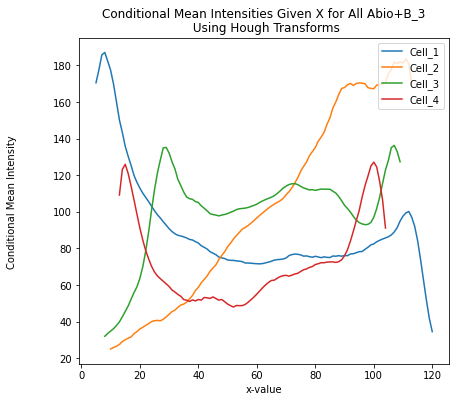

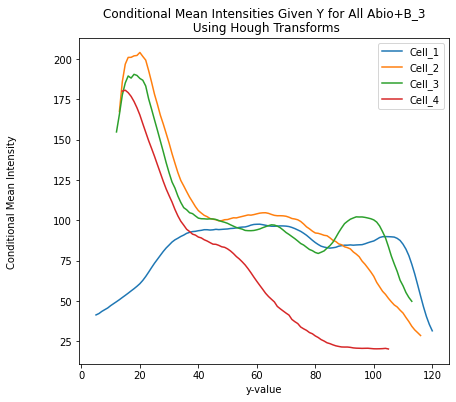

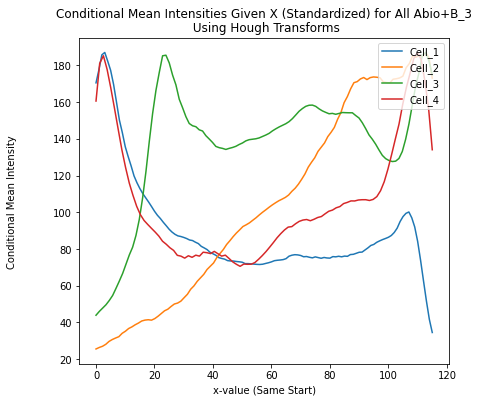

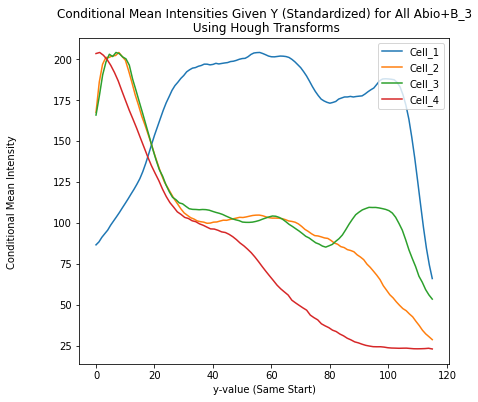

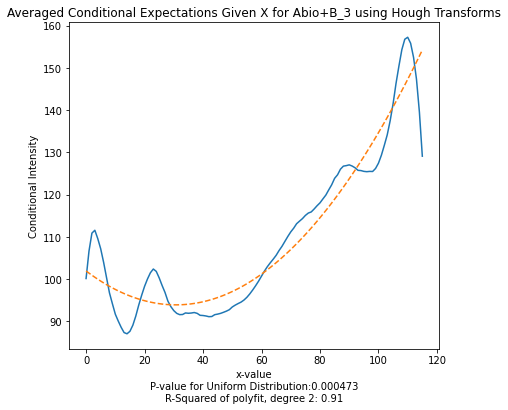

...

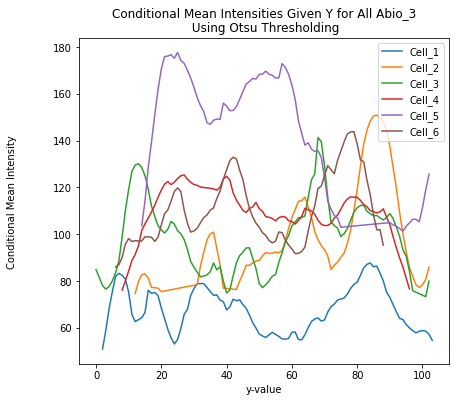

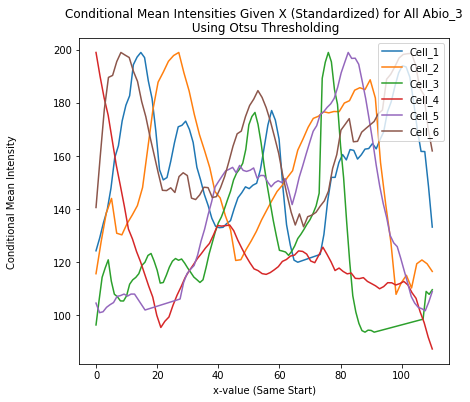

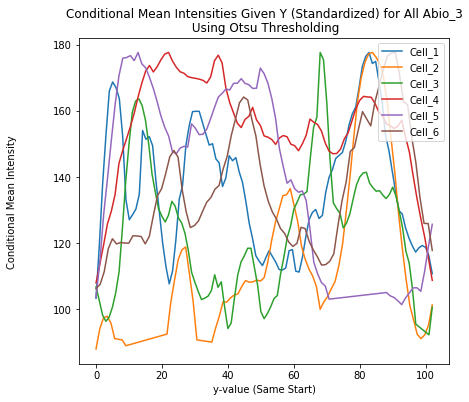

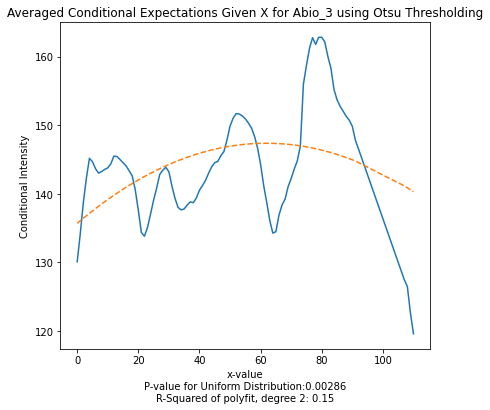

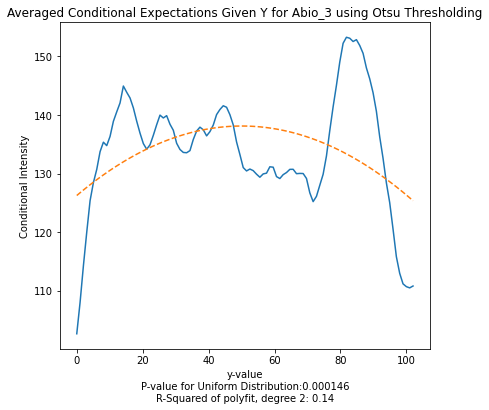

In [21]:
np.random.seed(100)
def stackedPlotsGivenACellType(imgDict, cellType, save = False, thresholdMethod = False):
  cellNumbers = imgDict[cellType].keys()
  plotifiableIntensities = dict()
  intensitiesGivenX = dict()
  intensitiesGivenXSameStart = dict()
  intensitiesGivenY = dict()
  intensitiesGivenYSameStart = dict()
  sigFigsXInput = dict()
  sigFigsYInput = dict()
  sigFigs = 3

  for cellNumber in cellNumbers:
    imageAnalysis = imgDict[cellType][cellNumber]["Image"]
    if (thresholdMethod):
      plotifiableIntensities[cellNumber] = getOtsuThresholdDict(imageAnalysis, plot = False)
    else:
      circleCoords = identifyCircleCoordinates(imageAnalysis)
      circleIntensities = getCircleIntensities(imageAnalysis, circleCoords) 
      plotifiableIntensities[cellNumber] = simplifyIntensitiesAndPlot(circleIntensities, plot = False)
    intensitiesGivenX[cellNumber] = makeIntensityGraph2D(plotifiableIntensities[cellNumber], xView = True, plot = False)
    intensitiesGivenY[cellNumber] = makeIntensityGraph2D(plotifiableIntensities[cellNumber], xView = False, plot = False)

    intensitiesGivenXSameStart[cellNumber] = (intensitiesGivenX[cellNumber][0] - np.min(intensitiesGivenX[cellNumber][0]),
                                               intensitiesGivenX[cellNumber][1])
    intensitiesGivenYSameStart[cellNumber] = (intensitiesGivenY[cellNumber][0] - np.min(intensitiesGivenY[cellNumber][0]),
                                               intensitiesGivenY[cellNumber][1])
    randomDistributionGivenX = np.random.uniform(low = np.min(intensitiesGivenX[cellNumber][1]),
                                                             high = np.max(intensitiesGivenX[cellNumber][1]),
                                                             size = len(intensitiesGivenX[cellNumber][1]))
    randomDistributionGivenY = np.random.uniform(low = np.min(intensitiesGivenY[cellNumber][1]), 
                                                             high = np.max(intensitiesGivenY[cellNumber][1]), 
                                                             size = len(intensitiesGivenY[cellNumber][1]))
    ksTestTwoSampleForX = ks_2samp(randomDistributionGivenX, intensitiesGivenX[cellNumber][1]).pvalue

    sigFigsXInput[cellNumber] = -int(math.floor(math.log10(abs(ksTestTwoSampleForX))))+sigFigs-1
    ksTestTwoSampleForY = ks_2samp(randomDistributionGivenY, intensitiesGivenY[cellNumber][1]).pvalue
    sigFigsYInput[cellNumber] = -int(math.floor(math.log10(abs(ksTestTwoSampleForY))))+sigFigs-1

  maxX0 = -1
  maxY0 = -1
  maxX1 = -1
  maxY1 = -1
  for cellNumber in cellNumbers:
    maxXTmp0 = np.max(intensitiesGivenXSameStart[cellNumber][0])
    maxYTmp0 = np.max(intensitiesGivenYSameStart[cellNumber][0])
    maxXTmp1 = np.max(intensitiesGivenXSameStart[cellNumber][1])
    maxYTmp1 = np.max(intensitiesGivenYSameStart[cellNumber][1])

    if (maxX0 < maxXTmp0):
      maxX0 = maxXTmp0
    if (maxY0 < maxYTmp0):
      maxY0 = maxYTmp0
    if (maxX1 < maxXTmp1):
      maxX1 = maxXTmp1
    if (maxY1 < maxYTmp1):
      maxY1 = maxYTmp1
  for cellNumber in cellNumbers:
    ratioX0 = maxX0/np.max(intensitiesGivenXSameStart[cellNumber][0])
    ratioY0 = maxY0/np.max(intensitiesGivenYSameStart[cellNumber][0])
    ratioX1 = maxX1/np.max(intensitiesGivenXSameStart[cellNumber][1])
    ratioY1 = maxY1/np.max(intensitiesGivenYSameStart[cellNumber][1])
    intensitiesGivenXSameStart[cellNumber] = (ratioX0 * intensitiesGivenXSameStart[cellNumber][0], ratioX1 * intensitiesGivenXSameStart[cellNumber][1])
    intensitiesGivenYSameStart[cellNumber] = (ratioY0 *intensitiesGivenYSameStart[cellNumber][0], ratioY1 * intensitiesGivenYSameStart[cellNumber][1])

  fig1 = plt.figure(figsize=(8, 6))
  fig2 = plt.figure(figsize=(8, 6))
  fig3 = plt.figure(figsize=(8, 6))
  fig4 = plt.figure(figsize=(8, 6))

  gs1 = GridSpec(nrows=1, ncols=6)
  ax1Fig1 = fig1.add_subplot(gs1[0, 0:5])
  ax2Fig1 = fig2.add_subplot(gs1[0, 0:5])
  ax3Fig1 = fig3.add_subplot(gs1[0, 0:5])
  ax4Fig1 = fig4.add_subplot(gs1[0, 0:5])
  ax1Fig1.set_xlabel("x-value")
  ax2Fig1.set_xlabel("y-value")
  ax3Fig1.set_xlabel("x-value (Same Start)")
  ax4Fig1.set_xlabel("y-value (Same Start)")

  if (thresholdMethod):
    methodUsed = "Otsu Thresholding"
  else:
    methodUsed = "Hough Transforms"

  ax1Fig1.set_title(f"Conditional Mean Intensities Given X for All {cellType}\n Using {methodUsed}")  
  ax2Fig1.set_title(f"Conditional Mean Intensities Given Y for All {cellType}\n Using {methodUsed}") 
  ax3Fig1.set_title(f"Conditional Mean Intensities Given X (Standardized) for All {cellType}\n Using {methodUsed}")  
  ax4Fig1.set_title(f"Conditional Mean Intensities Given Y (Standardized) for All {cellType}\n Using {methodUsed}") 
  fig1.text(0.0, 0.5, "Conditional Mean Intensity", va='center', rotation='vertical')
  fig2.text(0.0, 0.5, "Conditional Mean Intensity", va='center', rotation='vertical')
  fig3.text(0.0, 0.5, "Conditional Mean Intensity", va='center', rotation='vertical')
  fig4.text(0.0, 0.5, "Conditional Mean Intensity", va='center', rotation='vertical')

  rangeMaxX = -1
  rangeCallX = ""
  rangeMaxY = -1
  rangeCallY = ""

  for cellNumber in cellNumbers:
      ax1Fig1.plot(intensitiesGivenX[cellNumber][0], intensitiesGivenX[cellNumber][1], label = cellNumber)
      ax2Fig1.plot(intensitiesGivenY[cellNumber][0], intensitiesGivenY[cellNumber][1], label = cellNumber)
      ax3Fig1.plot(intensitiesGivenXSameStart[cellNumber][0], intensitiesGivenXSameStart[cellNumber][1], label = cellNumber)
      ax4Fig1.plot(intensitiesGivenYSameStart[cellNumber][0], intensitiesGivenYSameStart[cellNumber][1], label = cellNumber)
      lenX = len(intensitiesGivenXSameStart[cellNumber][0])
      lenY = len(intensitiesGivenYSameStart[cellNumber][0])
      if (lenX > rangeMaxX):
        rangeCallX = cellNumber
        rangeMaxX = lenX

      if (lenY > rangeMaxY):
        rangeCallY = cellNumber
        rangeMaxY = lenY

  # Interpolation and making figures 5 and 6:
  x0new = intensitiesGivenXSameStart[rangeCallX][0]
  y0new = intensitiesGivenYSameStart[rangeCallY][0]
  x1newAvg = np.zeros(len(x0new))
  y1newAvg = np.zeros(len(y0new))
  nSamples = len(cellNumbers)
  
  

  for cellNumber in cellNumbers:
    x0 = intensitiesGivenXSameStart[cellNumber][0]
    assert(abs(min(x0) - min(x0new)) <= 0.0001)
    assert(abs(max(x0) - max(x0new)) <= 0.0001)
    x0[0] = 0
    x0[len(x0)-1] = x0new[len(x0new)-1] 

    y0 = intensitiesGivenYSameStart[cellNumber][0]
    assert(abs(min(y0) - min(y0new)) <= 0.0001)
    assert(abs(max(y0) - max(y0new)) <= 0.0001)
    y0[0] = 0
    y0[len(y0)-1] = y0new[len(y0new)-1] 
  
    x1 = intensitiesGivenXSameStart[cellNumber][1]
    y1 = intensitiesGivenYSameStart[cellNumber][1]
    
    fx = interpolate.interp1d(x0, x1)
    fy = interpolate.interp1d(y0, y1)
    x1new = fx(x0new)
    y1new = fy(y0new)
    y1newAvg += y1new/nSamples
    x1newAvg += x1new/nSamples
  uniformGivenX = np.random.uniform(low = np.min(x1newAvg),
                                                             high = np.max(x1newAvg),
                                                             size = len(x1newAvg))
  uniformGivenY = np.random.uniform(low = np.min(y1newAvg),
                                                             high = np.max(y1newAvg),
                                                             size = len(y1newAvg))
  ksPvalXNew = ks_2samp(uniformGivenX, x1newAvg).pvalue
  ksPvalXSigFigs = -int(math.floor(math.log10(abs(ksPvalXNew))))+sigFigs-1
  ksPvalYNew = ks_2samp(uniformGivenY, y1newAvg).pvalue
  ksPvalYSigFigs = -int(math.floor(math.log10(abs(ksPvalYNew))))+sigFigs-1

  ksTestTwoSampleForY = ks_2samp(randomDistributionGivenY, y1newAvg).pvalue
  sigFigsYInputAvg = -int(math.floor(math.log10(abs(ksTestTwoSampleForY))))+sigFigs-1

  ax1Fig1.legend(loc='upper right')
  ax2Fig1.legend(loc='upper right')
  ax3Fig1.legend(loc='upper right')
  ax4Fig1.legend(loc='upper right')

  # Plot figure five: taking the interpolated mean at interpolated points:
  # -https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.interp1d.html
  fig5 = plt.figure(figsize=(8, 6))
  ax5Fig1 = fig5.add_subplot(gs1[0, 0:5])
  ax5Fig1.plot(x0new, x1newAvg)

  resX = polyfit(x0new, x1newAvg,2)

  ax5Fig1.plot(x0new, resX["plot-yhat"], "--")
  rSquaredValX = round(resX["r-squared"], 2)
  xLabel = f"x-value\nP-value for Uniform Distribution:{round(ksPvalXNew,ksPvalXSigFigs)}\nR-Squared of polyfit, degree 2: {rSquaredValX}"
  ax5Fig1.set_xlabel(xLabel)
  ax5Fig1.set_title(f"Averaged Conditional Expectations Given X for {cellType} using {methodUsed}")
  ax5Fig1.set_ylabel("Conditional Intensity")

  fig6 = plt.figure(figsize=(8, 6))
  ax6Fig1 = fig6.add_subplot(gs1[0, 0:5])
  ax6Fig1.plot(y0new, y1newAvg)
  resY = polyfit(y0new, y1newAvg,2)
  ax6Fig1.plot(y0new, resY["plot-yhat"], "--")
  rSquaredValY = round(resY["r-squared"], 2)
  xLabel = f"y-value\nP-value for Uniform Distribution:{round(ksPvalYNew,ksPvalYSigFigs)}\nR-Squared of polyfit, degree 2: {rSquaredValY}"
  ax6Fig1.set_xlabel(xLabel)
  ax6Fig1.set_title(f"Averaged Conditional Expectations Given Y for {cellType} using {methodUsed}")
  ax6Fig1.set_ylabel("Conditional Intensity")


  
  if (save):
    figs = [fig1, fig2, fig3, fig4,fig5,fig6]
    labels = ["Given_X", "Given_Y", "Given_X_Standardized","Given_Y_Standardized","Given_X_Average", "Given_Y_Average"]
    nFigs = len(figs)
    nameFigs = list()
    for i in range(nFigs):
      nameFig = f"{cellType}_Stacked_ConditionalMean_Fig{labels[i]}"
      if (thresholdMethod):
        nameFig += "_thresholdMethod"
      else:
        nameFig += "_HoughTransformMethod"
      nameFig += ".png"
      figs[i].savefig(nameFig)
      files.download(nameFig)

stackedPlotsGivenACellType(imgFilteredDict, "Abio+B_3")
stackedPlotsGivenACellType(imgFilteredDict, "Abio_0")
stackedPlotsGivenACellType(imgFilteredDict, "Abio_3")
stackedPlotsGivenACellType(imgFilteredDict, "Abio+B_0")

stackedPlotsGivenACellType(imgFilteredDict, "Abio+B_0", thresholdMethod = True)
stackedPlotsGivenACellType(imgFilteredDict, "Abio+B_3", thresholdMethod = True)
stackedPlotsGivenACellType(imgFilteredDict, "Abio_0", thresholdMethod = True)
stackedPlotsGivenACellType(imgFilteredDict, "Abio_3", thresholdMethod = True)


# Downloading all Plots Given a Cell Type

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:76: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:175: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:74: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:74: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:74: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:76: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:74: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

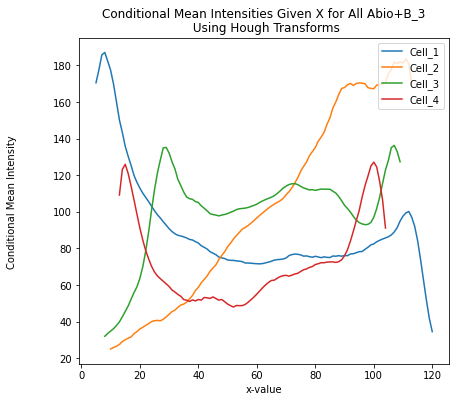

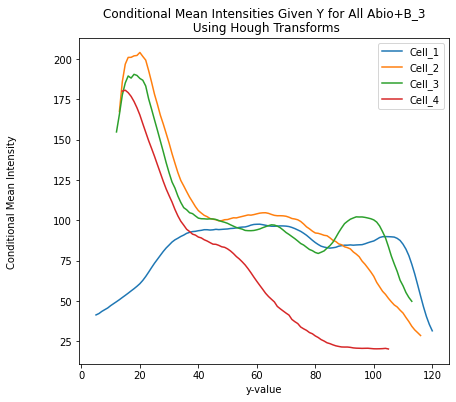

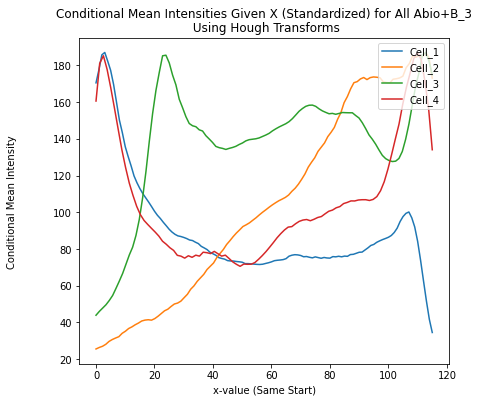

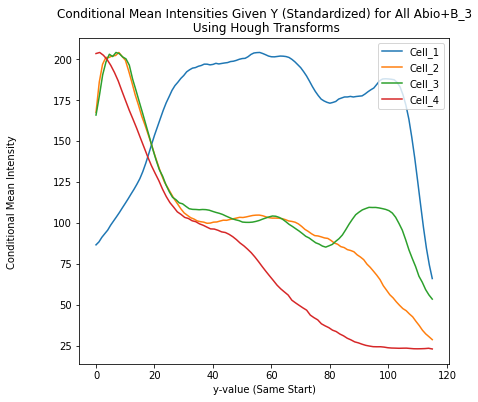

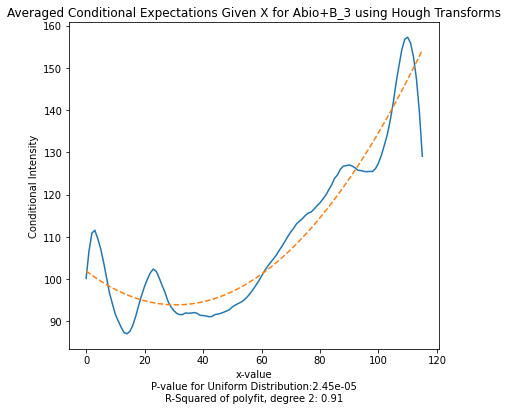

...

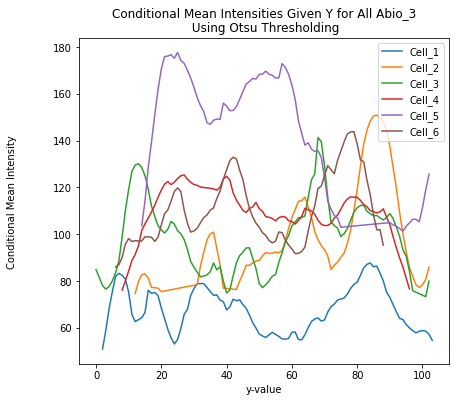

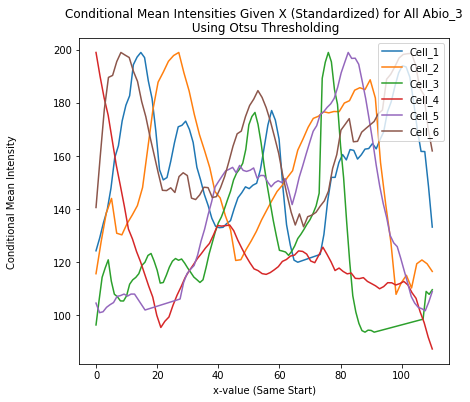

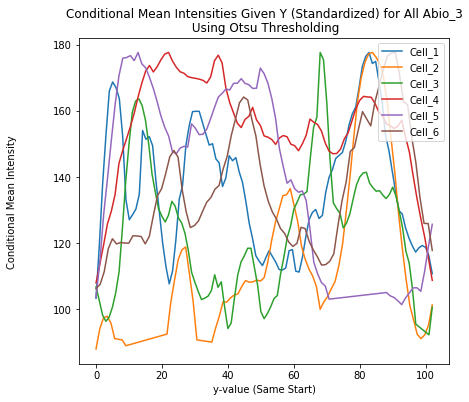

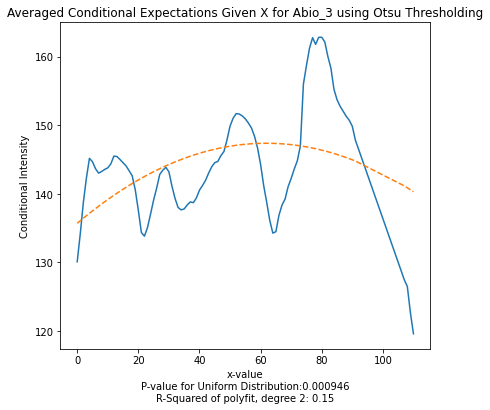

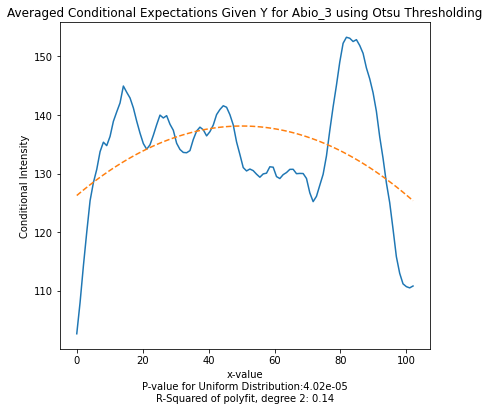

In [ ]:
# stackedPlotsGivenACellType(imgFilteredDict, "Abio+B_3", save = True)
# stackedPlotsGivenACellType(imgFilteredDict, "Abio_0", save = True)
# stackedPlotsGivenACellType(imgFilteredDict, "Abio_3", save = True)
# stackedPlotsGivenACellType(imgFilteredDict, "Abio+B_0", save = True)

# stackedPlotsGivenACellType(imgFilteredDict, "Abio+B_0", save = True, thresholdMethod = True)
# stackedPlotsGivenACellType(imgFilteredDict, "Abio+B_3", save = True, thresholdMethod = True)
# stackedPlotsGivenACellType(imgFilteredDict, "Abio_0", save = True, thresholdMethod = True)
# stackedPlotsGivenACellType(imgFilteredDict, "Abio_3", save = True, thresholdMethod = True)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

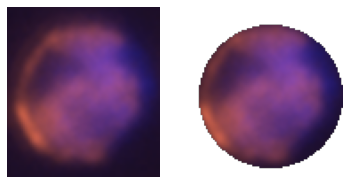

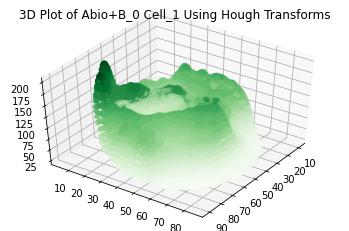

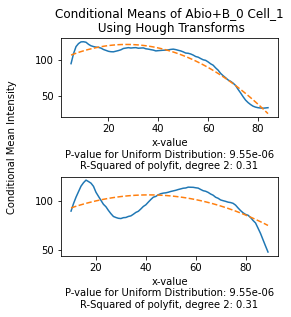

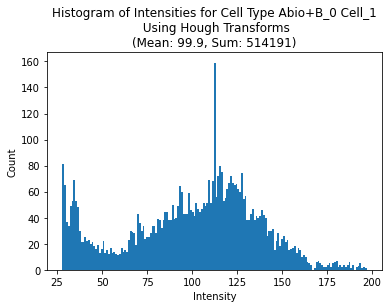

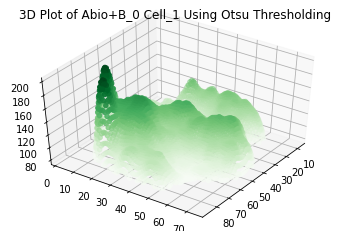

...

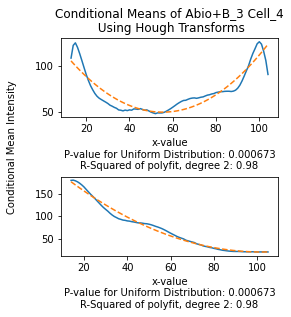

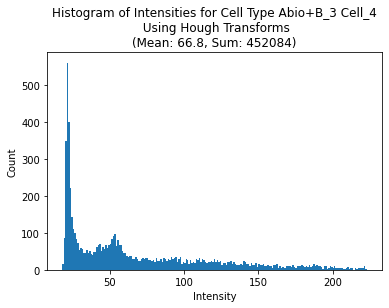

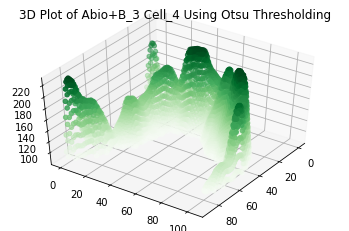

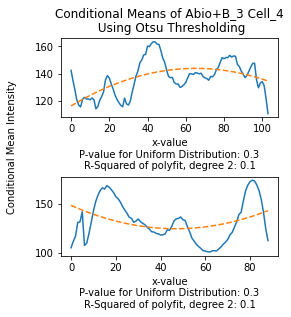

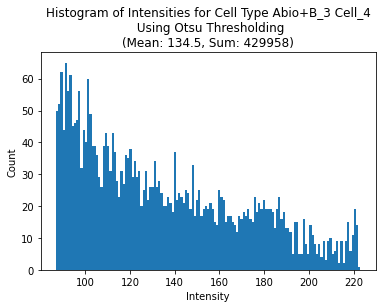

In [ ]:
# for cell_type in imgFilteredDict.keys():
#   for cell_num in imgFilteredDict[cell_type].keys():
#     displayResultsFigure(imgFilteredDict, cell_type, cell_num, useMask = False, referenceDict = imgDict, save = True)
#     displayResultsFigure(imgFilteredDict, cell_type, cell_num, save = True, thresholdMethod=True)

